In [ ]:
https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
https://github.com/slundberg/shap
https://shap.readthedocs.io/en/latest/index.html
    
https://pypi.org/project/BorutaShap/
https://github.com/scikit-learn-contrib/boruta_py
https://github.com/Ekeany/Boruta-Shap/tree/master/Examples

## SHAP

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
# from imblearn.over_sampling import SMOTE
import shap

FEATURES = ['commits_count','code_churn_avg','contributors_count','contributors_experience','hunks_count',
            'issue_tracker_issues','cbo','wmc','dit','rfc','lcom','max_nested_blocks','total_refactorings',
            'ncloc_cloc','duplicated_lines_cpd_density','comment_lines_cloc_density','total_variables',
            'total_methods','Max-Ruler']

# Importing the dataset
dataset = pd.read_csv('dataset_final.csv', sep=',') # usecols = FEATURES

In [3]:
# create X and Y
Y = dataset['Max-Ruler']
X =  dataset[['commits_count','code_churn_avg','contributors_count','contributors_experience','hunks_count',
            'issue_tracker_issues','cbo','wmc','dit','rfc','lcom','max_nested_blocks','total_refactorings',
            'ncloc_cloc','duplicated_lines_cpd_density','comment_lines_cloc_density','total_variables',
            'total_methods']]

# Split the data into train and test data:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=0)

# Normalise using MinMax
# scaler = MinMaxScaler() # or StandardScaler
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)

# Resampling using SMOTE
# sm = SMOTE(random_state=0, sampling_strategy=1)
# X_train, Y_train = sm.fit_resample(X_train, Y_train)

# Build the model with the random forest algorithm:
model = RandomForestClassifier(random_state=0)
model.fit(X_train, Y_train)

RandomForestClassifier(random_state=0)

In [6]:
oo = Y_train.index[Y_train == 1].tolist()
oo.sort()
oo

[0,
 1,
 2,
 3,
 5,
 12,
 13,
 18,
 19,
 21,
 23,
 24,
 28,
 29,
 31,
 34,
 38,
 231,
 232,
 233,
 234,
 236,
 238,
 244,
 245,
 246,
 249,
 252,
 256,
 258,
 267,
 511,
 512,
 513,
 514,
 515,
 519,
 521,
 522,
 523,
 525,
 526,
 528,
 530,
 532,
 533,
 534,
 535,
 537,
 538,
 539,
 541,
 544,
 545,
 547,
 549,
 556,
 559,
 560,
 561,
 566,
 567,
 570,
 573,
 1020,
 1021,
 1022,
 1023,
 1024,
 1025,
 1026,
 1027,
 1033,
 1037,
 1039,
 1041,
 1043,
 1051,
 1056,
 1080,
 1081,
 1082,
 1083,
 1084,
 1085,
 1087,
 1089,
 1090,
 1091,
 1092,
 1093,
 1094,
 1095,
 1096,
 1098,
 1102,
 1103,
 1104,
 1105,
 1106,
 1107,
 1109,
 1110,
 1111,
 1115,
 1116,
 1118,
 1119,
 1120,
 1121,
 1123,
 1125,
 1130,
 1131,
 1134,
 1136,
 1137,
 1139,
 1140,
 1141,
 1142,
 1144,
 1149,
 1151,
 1155,
 1157,
 1159,
 1164,
 1169,
 1171,
 1172,
 1173,
 1176,
 1178,
 1181,
 1182,
 1184,
 1186,
 1187,
 1188,
 1192,
 1199,
 1201,
 1204,
 1214,
 1222,
 1227,
 1228,
 1231,
 1232,
 1239,
 1242,
 1247,
 1249,
 1250,
 

In [7]:
# Explain the model's predictions using SHAP
explainer = shap.explainers.Tree(model)
shap_values = explainer.shap_values(X_train)

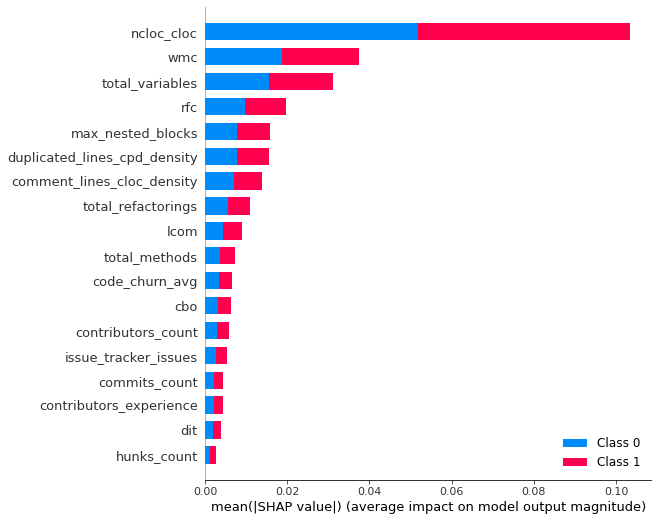

In [8]:
shap.summary_plot(shap_values, features=X_train)

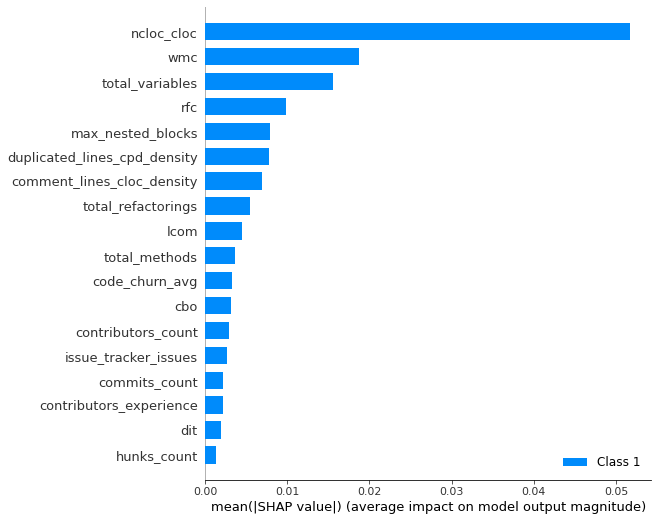

In [9]:
shap.summary_plot(shap_values, class_inds=[1], features=X_train)

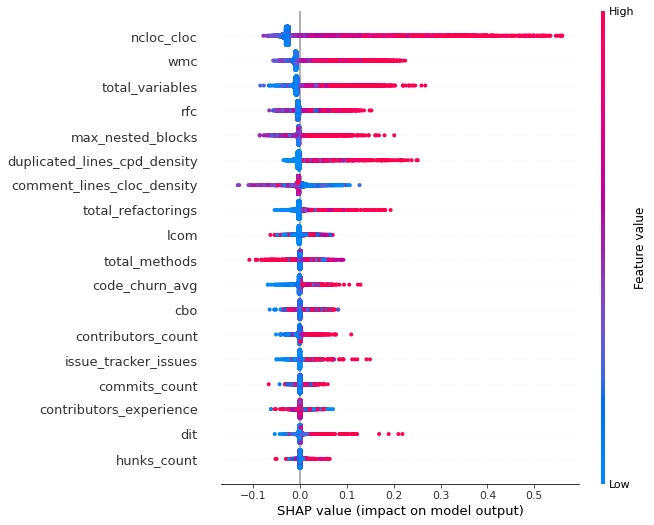

In [10]:
shap.summary_plot(shap_values[1], features=X_train)

In [4]:
shap.dependence_plot('ncloc_cloc', shap_values[1], features=X_train)

NameError: name 'shap_values' is not defined

In [14]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][708,:], features=X_train.iloc[708,:])

In [15]:
shap.force_plot(explainer.expected_value[1], shap_values[1][:10000,:], features=X_train.iloc[:10000,:])

shap.plots.force is slow for many thousands of rows, try subsampling your data.


## Boruta SHAP

In [ ]:
from BorutaShap import BorutaShap

Feature_Selector = BorutaShap(importance_measure='shap', classification=True)
Feature_Selector.fit(X=X_train, y=Y_train, n_trials=100, random_state=0)

In [ ]:
# Returns Boxplot of features
Feature_Selector.plot(X_size=12, figsize=(12,8), y_scale='log', which_features='all')

In [ ]:
# Handling class imbalance
model = RandomForestClassifier(class_weight = 'balanced')

Feature_Selector = BorutaShap(model=model, importance_measure='shap', classification=True)
Feature_Selector.fit(X=X_train, y=Y_train, n_trials=100, random_state=0)

## Boruta

In [ ]:
from boruta import BorutaPy

model = RandomForestClassifier(class_weight='balanced', random_state=0)
boruta = BorutaPy(estimator = model, max_iter = 100, random_state=0)

### fit Boruta (it accepts np.array, not pd.DataFrame)
boruta.fit(np.array(X_train), np.array(Y_train))

In [ ]:
### print results
green_area = X.columns[boruta.support_].to_list()
blue_area = X.columns[boruta.support_weak_].to_list()

print('features in the green area:', green_area)
print('features in the blue area:', blue_area)